# Preprocessing & feature Engineering
- train.csv, test.csv, macro.csv

## 1. Feature/Data Transformation
- Outlier 
- New feature

## 2. Missing Data Imputation
- regression
- Mean

## 3. Dimensionality Reduction
- Features with Bad or Constant Data
- Multicollinearity and Variance Inflation Factor

In [1]:
%matplotlib inline
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

import warnings
warnings.filterwarnings("ignore")
import sys
import datetime
import scipy as sp
import statsmodels.stats.api as sms
import statsmodels.api as sm
from patsy import dmatrix
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
import utils.preprocessing as pp 
import utils.correlation as cr
import utils.statsmodel_helper as st

df_macro = pd.read_csv('./data/macro.csv', parse_dates=['timestamp'])
df_train = pd.read_csv('./data/train.csv', index_col=0, parse_dates=['timestamp']).reset_index()
df_test = pd.read_csv('./data/test.csv', index_col=0, parse_dates=['timestamp']).reset_index()

In [2]:
df_train.shape

(30471, 292)

In [3]:
df_test.shape

(7662, 291)

In [4]:
df_train.tail()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_av

In [5]:
df_test.tail()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_av

In [6]:
df_macro.tail()

,timestamp,oil_urals,gdp_quart,gdp_quart_growth,cpi,ppi,gdp_deflator,balance_trade,balance_trade_growth,usdrub,eurrub,brent,net_capital_export,gdp_annual,gdp_annual_growth,average_provision_of_build_contract,average_provision_of_build_contract_moscow,rts,micex,micex_rgbi_tr,micex_cbi_tr,deposits_value,deposits_growth,deposits_rate,mortgage_value,mortgage_growth,mortgage_rate,grp,grp_growth,income_per_cap,real_dispos_income_per_cap_growth,salary,salary_growth,fixed_basket,retail_trade_turnover,retail_trade_turnover_per_cap,retail_trade_turnover_growth,labor_force,unemployment,employment,invest_fixed_capital_per_cap,invest_fixed_assets,profitable_enterpr_share,unprofitable_enterpr_share,share_own_revenues,overdue_wages_per_cap,fin_res_per_cap,marriages_per_1000_cap,divorce_rate,construction_value,invest_fixed_assets_phys,pop_natural_increase,pop_migration,pop_total_inc,childbirth,mortality,housing_fund_sqm,lodging_sqm_per_cap,water_pipes_share,baths_share,sewerage_share,gas_share,hot_water_share,electric_stove_share,heating_share,old_house_share,average_life_exp,infant_mortarity_per_1000_cap,perinatal_mort_per_1000_cap,incidence_population,rent_price_4+room_bus,rent_price_3room_bus,rent_price_2room_bus,rent_price_1room_bus,rent_price_3room_eco,rent_price_2room_eco,rent_price_1room_eco,load_of_teachers_preschool_per_teacher,child_on_acc_pre_school,load_of_teachers_school_per_teacher,students_state_oneshift,modern_education_share,old_education_build_share,provision_doctors,provision_nurse,load_on_doctors,power_clinics,hospital_beds_available_per_cap,hospital_bed_occupancy_per_year,provision_retail_space_sqm,provision_retail_space_modern_sqm,turnover_catering_per_cap,theaters_viewers_per_1000_cap,seats_theather_rfmin_per_100000_cap,museum_visitis_per_100_cap,bandwidth_sports,population_reg_sports_share,students_reg_sports_share,apartment_build,apartment_fund_sqm
2479,2016-10-15,44.3677,19979.4,-0.6,531.0,601.9,133.16,5.823,2.6,62.9573,69.0250,51.95,-0.408111,80804.3,-0.037267,6.2,7.71,983.04,1966.39,133.55,313.73,23453188,0.016931,NaN,899539,0.382095,12.66,NaN,NaN,NaN,NaN,NaN,NaN,20354.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.76,99.65,69.81,50.2,45.71,38.4,29.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2480,2016-10-16,44.3677,19979.4,-0.6,531.0,601.9,133.16,5.823,2.6,62.9573,69.0250,51.95,-0.408111,80804.3,-0.037267,6.2,7.71,983.04,1966.39,133.55,313.73,23453188,0.016931,NaN,899539,0.382095,12.66,NaN,NaN,NaN,NaN,NaN,NaN,20354.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.76,99.65,69.81,50.2,45.71,38.4,29.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2481,2016-10-17,44.3677,19979.4,-0.6,531.0,601.9,133.16,5.823,2.6,63.0856,69.3953,51.52,-0.408111,80804.3,-0.037267,6.2,7.71,977.30,1956.95,133.09,313.61,23453188,0.016931,NaN,899539,0.382095,12.66,NaN,NaN,NaN,NaN,NaN,NaN,20354.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.76,99.65,69.81,50.2,45.71,38.4,29.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2482,2016-10-18,44.3677,19979.4,-0.6,531.0,601.9,133.16,5.823,2.6,62.9512,69.1790,51.68,-0.408111,80804.3,-0.037267,6.2,7.71,986.94,1969.11,132.88,313.21,23453188,0.016931,NaN,899539,0.382095,12.66,NaN,NaN,NaN,NaN,NaN,NaN,20354.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.76,99.65,69.81,50.2,45.71,38.4,29.78,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2483,2016-10-19,44.3677,19979.4,-0.6,531.0,601.9,133.16,5.823,2.6,62.9512,69.1

In [7]:
df_train_macro = pd.merge(df_train, df_macro, on='timestamp')
df_train_macro.tail()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_av

In [8]:
df_test_macro = pd.merge(df_test, df_macro, on='timestamp')
df_test_macro.tail()

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,sub_area,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,ID_metro,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,ID_railroad_station_walk,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,ID_big_road1,big_road1_1line,big_road2_km,ID_big_road2,railroad_km,railroad_1line,zd_vokzaly_avto_km,ID_railroad_terminal,bus_terminal_avto_km,ID_bus_terminal,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_av

In [9]:
df_train_macro.shape

(30471, 391)

In [10]:
df_test_macro.shape

(7662, 390)

## 1. Feature/Data Transformation
- Outlier
- New features

In [11]:
# macro data에서 missing value 50% 이상이면 drop 
del df_train_macro["modern_education_share"]
del df_train_macro["old_education_build_share"]
del df_train_macro["provision_retail_space_sqm"]
del df_train_macro["provision_retail_space_modern_sqm"]

## Outlier

In [14]:
# Drop data with extremely big price #
df_train_macro = df_train_macro.drop([2121]) 

# Replace outliers with proper value #
df_train_macro.loc[df_train_macro.state == 33, 'state'] = 3
df_train_macro.loc[df_train_macro['life_sq'] > 1000,     'life_sq']       = np.median(df_train_macro['life_sq'].dropna())
df_train_macro.loc[df_train_macro['kitch_sq'] > 250,     'kitch_sq']      = np.median(df_train_macro['kitch_sq'].dropna())
df_train_macro.loc[df_train_macro['num_room'] > 6,       'num_room']      = np.median(df_train_macro['num_room'].dropna())
df_train_macro.loc[df_train_macro['build_year'] > 2017,  'build_year']    = np.median(df_train_macro['build_year'].dropna())
df_train_macro.loc[df_train_macro['build_year'] < 1800,  'build_year']    = np.median(df_train_macro['build_year'].dropna())
df_train_macro.loc[df_train_macro['floor'] > 50,         'floor']         = np.median(df_train_macro['floor'].dropna())
df_train_macro.loc[df_train_macro['max_floor'] > 60,     'max_floor']     = np.median(df_train_macro['max_floor'].dropna())
df_train_macro.loc[df_train_macro.full_sq == 0, 'full_sq'] = 50
df_train_macro = df_train_macro[df_train_macro.price_doc/df_train_macro.full_sq <= 600000]
df_train_macro = df_train_macro[df_train_macro.price_doc/df_train_macro.full_sq >= 10000]

df_test_macro.loc[df_test_macro['life_sq'] > 1000,     'life_sq']       = np.median(df_test_macro['life_sq'].dropna())
df_test_macro.loc[df_test_macro['kitch_sq'] > 250,     'kitch_sq']      = np.median(df_test_macro['kitch_sq'].dropna())
df_test_macro.loc[df_test_macro['num_room'] > 6,       'num_room']      = np.median(df_test_macro['num_room'].dropna())
df_test_macro.loc[df_test_macro['build_year'] > 2017,  'build_year']    = np.median(df_test_macro['build_year'].dropna())
df_test_macro.loc[df_test_macro['build_year'] < 1800,  'build_year']    = np.median(df_test_macro['build_year'].dropna())
df_test_macro.loc[df_test_macro['floor'] > 50,         'floor']         = np.median(df_test_macro['floor'].dropna())
df_test_macro.loc[df_test_macro['max_floor'] > 60,     'max_floor']     = np.median(df_test_macro['max_floor'].dropna())
df_test_macro.loc[df_test_macro.full_sq == 0, 'full_sq'] = 50

# pp.clean_data(df_train)
# pp.clean_data(df_test)

## New features

In [15]:
# Add month and day of week #
df_train_macro['month'] = df_train_macro.timestamp.dt.month
df_train_macro['dow'] = df_train_macro.timestamp.dt.dayofweek

df_train_macro['month'] = df_train_macro.timestamp.dt.month
df_train_macro['dow'] = df_train_macro.timestamp.dt.dayofweek

# Create new features that might help #
df_train_macro['rel_floor'] = df_train_macro['floor'] / df_train_macro['max_floor'].astype(float)
df_train_macro['rel_kitch_sq'] = df_train_macro['kitch_sq'] / df_train_macro['full_sq'].astype(float)

df_test_macro['rel_floor'] = df_test_macro['floor'] / df_test_macro['max_floor'].astype(float)
df_test_macro['rel_kitch_sq'] = df_test_macro['kitch_sq'] / df_test_macro['full_sq'].astype(float)

df_train_macro.apartment_name=df_train_macro.sub_area + df_train_macro['metro_km_avto'].astype(str)
df_test_macro.apartment_name=df_test_macro.sub_area + df_test_macro['metro_km_avto'].astype(str)

df_train_macro['room_size'] = df_train_macro['life_sq'] / df_train_macro['num_room'].astype(float)
df_test_macro['room_size'] = df_test_macro['life_sq'] / df_test_macro['num_room'].astype(float)

# Average price corresponding to sub_area and ID_* #
id_features = ['ID_metro',
    'ID_railroad_station_walk', \
    'ID_big_road1', \
    'ID_big_road2', \
    'ID_railroad_terminal', \
    'ID_bus_terminal']

for id_f in id_features:
    df_test_macro['avg_price_' + id_f] = 0.0
    for val in df_test_macro[id_f].unique():
        if val == 171 and id_f == 'ID_metro':
            df_test_macro.loc[df_test_macro.ID_metro == 171, 'avg_price_ID_metro'] = df_train_macro[df_train_macro.ID_metro == 170]['price_doc'].mean()
            continue
        if val == 132 and id_f == 'ID_railroad_station_walk':
            df_test_macro.loc[df_test_macro.ID_railroad_station_walk == 132, 'avg_price_ID_railroad_station_walk'] = df_train_macro[df_train_macro.ID_railroad_station_walk == 131]['price_doc'].mean()
            continue
        if val == 121 and id_f == 'ID_railroad_station_walk':
            df_test_macro.loc[df_test_macro.ID_railroad_station_walk == 122, 'avg_price_ID_railroad_station_walk'] = df_train_macro[df_train_macro.ID_railroad_station_walk == 131]['price_doc'].mean()
            continue
        avg = df_train_macro[df_train_macro[id_f] == val]['price_doc'].mean()
        df_test_macro.loc[df_test_macro[id_f] == val, 'avg_price_' + id_f] = avg
    del df_test_macro[id_f]
    
for id_f in id_features:
    df_train_macro['avg_price_' + id_f] = 0.0
    for val in df_train_macro[id_f].unique():
        avg = df_train_macro[df_train_macro[id_f] == val]['price_doc'].mean()
        df_train_macro.loc[df_train_macro[id_f] == val, 'avg_price_' + id_f] = avg
    del df_train_macro[id_f]
    
cols = list(df_train_macro.columns.values)
cols.pop(cols.index('price_doc'))
df_train_macro = df_train_macro[cols + ['price_doc']]


df_test_macro['avg_price_sub_area'] = 0.0
df_train_macro['avg_price_sub_area'] = 0.0
for subarea in df_train_macro['sub_area'].unique():
    avg = df_train_macro[df_train_macro['sub_area'] == subarea]['price_doc'].mean()
    df_train_macro.loc[df_train_macro['sub_area'] == subarea, 'avg_price_sub_area'] = avg
    df_test_macro.loc[df_test_macro['sub_area'] == subarea, 'avg_price_sub_area'] = avg
del df_train_macro['sub_area']
del df_test_macro['sub_area']

# 2. Missing Data Imputation

In [16]:
pp.find_missing_data_columns(df_train_macro)

,missing_column,missing_count
3,life_sq,6379
4,floor,167
5,max_floor,9539
6,material,9539
7,build_year,13569
8,num_room,9539
9,kitch_sq,9539
10,state,13525
17,preschool_quota,6677
20,school_quota,6674


In [20]:
df_train_macro.replace([np.inf, -np.inf], np.nan, inplace=True)
df_test_macro.replace([np.inf, -np.inf], np.nan, inplace=True)
df_train_macro._get_numeric_data()[df_train._get_numeric_data() < 0] = 0
df_test_macro._get_numeric_data()[df_test._get_numeric_data() < 0] = 0

In [22]:
df_train_macro = pp.impute_by_regression(df_train_macro, 4, 0.3)

In [23]:
pp.find_missing_data_columns(df_train_macro)

,missing_column,missing_count
6,material,9539
361,child_on_acc_pre_school,3237
381,rel_floor,9543
383,room_size,13679


In [25]:
# material -> categorical
df_train_macro.loc[df_train_macro['material'].isnull(), 'material'] = 0

In [27]:
pp.find_missing_data_columns(df_train_macro)

,missing_column,missing_count
361,child_on_acc_pre_school,3237
381,rel_floor,9543
383,room_size,13679


In [37]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'] == '#!']

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,area_m,raion_popul,green_zone_part,indust_part,children_preschool,preschool_quota,preschool_education_centers_raion,children_school,school_quota,school_education_centers_raion,school_education_centers_top_20_raion,hospital_beds_raion,healthcare_centers_raion,university_top_20_raion,sport_objects_raion,additional_education_raion,culture_objects_top_25,culture_objects_top_25_raion,shopping_centers_raion,office_raion,thermal_power_plant_raion,incineration_raion,oil_chemistry_raion,radiation_raion,railroad_terminal_raion,big_market_raion,nuclear_reactor_raion,detention_facility_raion,full_all,male_f,female_f,young_all,young_male,young_female,work_all,work_male,work_female,ekder_all,ekder_male,ekder_female,0_6_all,0_6_male,0_6_female,7_14_all,7_14_male,7_14_female,0_17_all,0_17_male,0_17_female,16_29_all,16_29_male,16_29_female,0_13_all,0_13_male,0_13_female,raion_build_count_with_material_info,build_count_block,build_count_wood,build_count_frame,build_count_brick,build_count_monolith,build_count_panel,build_count_foam,build_count_slag,build_count_mix,raion_build_count_with_builddate_info,build_count_before_1920,build_count_1921-1945,build_count_1946-1970,build_count_1971-1995,build_count_after_1995,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,railroad_station_walk_km,railroad_station_walk_min,railroad_station_avto_km,railroad_station_avto_min,ID_railroad_station_avto,public_transport_station_km,public_transport_station_min_walk,water_km,water_1line,mkad_km,ttk_km,sadovoe_km,bulvar_ring_km,kremlin_km,big_road1_km,big_road1_1line,big_road2_km,railroad_km,railroad_1line,zd_vokzaly_avto_km,bus_terminal_avto_km,oil_chemistry_km,nuclear_reactor_km,radiation_km,power_transmission_line_km,thermal_power_plant_km,ts_km,big_market_km,market_shop_km,fitness_km,swim_pool_km,ice_rink_km,stadium_km,basketball_km,hospice_morgue_km,detention_facility_km,public_healthcare_km,university_km,workplaces_km,shopping_centers_km,office_km,additional_education_km,preschool_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km,ecology,green_part_500,prom_part_500,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,cafe_count_500,cafe_sum_500_min_price_avg,cafe_sum_500_max_price_avg,cafe_avg_price_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,big_church_count_500,church_count_500,mosque_count_500,leisure_count_500,sport_count_500,market_count_500,green_part_1000,prom_part_1000,office_count_1000,office_sqm_1000,trc_count_1000,trc_sqm_1000,cafe_count_1000,cafe_sum_1000_min_price_avg,cafe_sum_1000_max_price_avg,cafe_avg_price_1000,cafe_count_1000_na_price,cafe_count_1000_price_500,cafe_count_1000_price_1000,cafe_count_1000_price_1500,cafe_count_1000_price_2500,cafe_count_1000_price_4000,cafe_count_1000_price_high,big_church_count_1000,church_count_1000,mosque_count_1000,leisure_count_1000,sport_count_1000,market_count_1000,green_part_1500,prom_part_1500,office_count_1500,office_sqm_1500,trc_count_1500,trc_sqm_1500,cafe_count_1500,cafe_sum_1500_min_price_avg,cafe_sum_1500_max_price_avg,cafe_avg_price_1500,cafe_count_1500_na_price,cafe_count_1500_price_500,cafe_count_1500_price_1000,cafe_count_1500_price_1500,cafe_count_1500_price_2500,cafe_count_1500_price_4000,cafe_count_1500_price_high,big_church_count_1500,church_count_1500,mosque_count_1500,leisure_count_1500,sport_count_1500,market_count_1500,green_part_2000,prom_part_2000,office_count_2000,office_sqm_2000,trc_count_2000,trc_sqm_2000,cafe_count_2000,cafe_sum_2000_min_price_avg,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_count_2000_na_price,cafe_count_2000_price_500,cafe_count_2000_price_1000,cafe_c

In [38]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'] == '#!', 'child_on_acc_pre_school'] = 0

In [48]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'] == '7.311', 'child_on_acc_pre_school'] = 7311

In [45]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'] == '3,013', 'child_on_acc_pre_school'] = 3013

In [46]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'] == '16,765', 'child_on_acc_pre_school'] = 16765

In [39]:
df_train_macro.loc[df_train_macro['child_on_acc_pre_school'].isnull(), 'child_on_acc_pre_school'] = np.median([df_train_macro['child_on_acc_pre_school']]).dropna()

TypeError: '<' not supported between instances of 'str' and 'int'

In [49]:
df_train_macro['child_on_acc_pre_school'].unique()

array([0, 7.311, 3013, 16765, nan], dtype=object)

In [30]:
df_train_macro['room_size'].unique()

array([         nan,  18.        ,  11.        ,  15.        ,
        37.        ,  13.66666667,  13.5       ,  20.        ,
        15.33333333,  31.        ,  16.66666667,  19.        ,
        41.        ,  14.5       ,  15.5       ,  14.        ,
        16.5       ,  21.        ,  12.        ,  16.        ,
        12.66666667,  11.5       ,  22.5       ,  23.        ,
        12.5       ,  17.        ,  14.33333333,  27.5       ,
        21.5       ,  17.5       ,  12.25      ,  71.        ,
        13.33333333,  14.66666667,  13.        ,  35.5       ,
        62.        ,  14.4       ,  45.5       ,  12.33333333,
        24.        ,  20.5       ,  17.33333333, 150.5       ,
       152.66666667,  15.75      ,  11.33333333,  17.66666667,
        18.33333333,  40.        ,  26.        ,  24.33333333,
        26.5       ,  35.        ,  15.66666667,  10.5       ,
        18.5       ,  34.        ,  22.        ,  10.        ,
        16.33333333,   0.5       ,   9.        ,  32.  

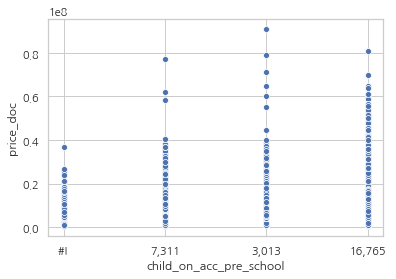

In [31]:
sns.scatterplot(x="child_on_acc_pre_school", y="price_doc", data=df_train_macro)

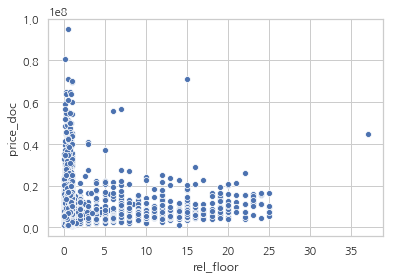

In [32]:
sns.scatterplot(x="rel_floor", y="price_doc", data=df_train_macro)

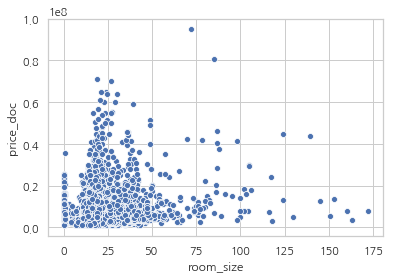

In [33]:
sns.scatterplot(x="room_size", y="price_doc", data=df_train_macro)